# Part 1: Detection of Fake / Real Profiles 

# Import libraries

In [117]:
import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import ydata_profiling as pp
from ydata_profiling import ProfileReport
import keras as k
from sklearn.model_selection import train_test_split
import keras
from keras import regularizers
from keras.models import Sequential,model_from_json
from keras.layers import Dense, Dropout, Activation
from keras import optimizers
from numpy.random import seed
seed(1)

# Read dataset

In [118]:
df_users = pd.read_csv("./dataset/users.csv")
df_fusers = pd.read_csv("./dataset/fusers.csv")

In [119]:
df_fusers.shape

(3351, 38)

In [120]:
df_users.shape

(3474, 42)

# Add isFake Column

In [121]:
#for df_users
isNotFake = np.zeros(3474)

#for df_fusers
isFake = np.ones(3351)

In [122]:
#adding is fake or not column to make predictions for it
df_fusers["isFake"] = isFake
df_users["isFake"] = isNotFake


# Combine different datasets into one

In [123]:
df_allUsers = pd.concat([df_fusers, df_users], ignore_index=True)
df_allUsers.columns = df_allUsers.columns.str.strip()

In [124]:
#to shuffle the whole data
df_allUsers = df_allUsers.sample(frac=1).reset_index(drop=True)

In [125]:
df_allUsers.describe()

,id,statuses_count,followers_count,friends_count,favourites_count,listed_count,default_profile,default_profile_image,geo_enabled,profile_use_background_image,...,is_translator,follow_request_sent,protected,verified,notifications,contributors_enabled,following,isFake,test_set_1,test_set_2
count,6.825000e+03,6825.000000,6825.000000,6825.000000,6825.000000,6825.000000,4066.0,19.0,2294.0,6426.0,...,1.0,0.0,78.0,11.0,0.0,0.0,0.0,6825.000000,3474.000000,3474.000000
mean,8.499737e+08,8667.221685,717.874432,504.022564,2378.999121,9.959853,1.0,1.0,1.0,1.0,...,1.0,NaN,1.0,1.0,NaN,NaN,NaN,0.490989,0.287853,0.141048
std,7.662248e+08,23473.945131,12301.657025,1159.286294,8548.235726,112.952257,0.0,0.0,0.0,0.0,...,NaN,NaN,0.0,0.0,NaN,NaN,NaN,0.499955,0.452827,0.348121
min,6.780330e+05,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,1.0,1.0,1.0,...,1.0,NaN,1.0,1.0,NaN,NaN,NaN,0.000000,0.000000,0.000000
25%,2.597067e+08,23.000000,12.000000,206.000000,0.000000,0.000000,1.0,1.0,1.0,1.0,...,1.0,NaN,1.0,1.0,NaN,NaN,NaN,0.000000,0.000000,0.000000
50%,6.168972e+08,190.000000,33.000000,312.000000,10.000000,0.000000,1.0,1.0,1.0,1.0,...,1.0,NaN,1.0,1.0,NaN,NaN,NaN,0.000000,0.000000,0.000000
75%,1.174963e+09,6900.000000,349.000000,555.000000,1360.000000,2.000000,1.0,1.0,1.0,1.0,...,1.0,NaN,1.0,1.0,NaN,NaN,NaN,1.000000,1.000000,0.000000
max,3.164942e+09,399555.000000,986837.000000,46310.000000,313954.000000,6166.000000,1.0,1.0,1.0,1.0,...,1.0,NaN,1.0,1.0,NaN,NaN,NaN,1.000000,1.000000,1.000000


In [126]:
df_allUsers.head()

,id,name,screen_name,statuses_count,followers_count,friends_count,favourites_count,listed_count,created_at,url,...,notifications,description,contributors_enabled,following,updated,isFake,timestamp,crawled_at,test_set_1,test_set_2
0,154856763,olobnew1,olobnew1,0,3,502,0,0,Sat Jun 12 11:39:51 +0000 2010,NaN,...,NaN,NaN,NaN,NaN,2013-06-12 18:38:35,1.0,NaN,NaN,NaN,NaN
1,1130403349,Rocky Coffey,RockyCoffey1,20,12,241,0,0,Tue Jan 29 08:05:57 +0000 2013,NaN,...,NaN,#teamfollowback becaue yo want to .,NaN,NaN,2013-06-12 18:38:35,1.0,NaN,NaN,NaN,NaN
2,618758991,Tashina Oconnor,tashinabwg,20,11,282,0,0,Tue Jun 26 03:14:10 +0000 2012,NaN,...,NaN,"Reggaeton, Rp, Hip - Hop R& 24/7",NaN,NaN,2013-06-12 18:38:35,1.0,NaN,NaN,NaN,NaN
3,2387366902,Ceddie ✨,HannahCedra,5361,435,375,1193,0,Thu Mar 06 04:34:47 +0000 2014,NaN,...,NaN,UofM17 BusinessMajor- Accountingsnapchat: cedr...,NaN,NaN,2016-03-15 15:56:46,0.0,2014-03-06 05:34:47,2015-05-01 12:56:24,0.0,0.0
4,555411470,salman Ali,MSalmanAli96,17732,1013,693,9557,1,Mon Apr 16 20:47:58 +0000 2012,NaN,...,NaN,Keep Calm and wait for your turn #ShiaGenocide...,NaN,NaN,2016-03-15 15:58:29,0.0,2012-04-16 22:47:58,2015-05-01 13:59:39,1.0,1.0


# Distribution of Data in X and Y

In [127]:
Y = df_allUsers.isFake

In [128]:
df_allUsers.drop(["isFake"], axis=1, inplace=True)
X = df_allUsers

In [129]:
profile = ProfileReport(X, title="Pandas Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [130]:
Y.reset_index(drop=True, inplace=True)

In [131]:
print(Y.shape)

(6825,)


In [132]:
X.head()

,id,name,screen_name,statuses_count,followers_count,friends_count,favourites_count,listed_count,created_at,url,...,verified,notifications,description,contributors_enabled,following,updated,timestamp,crawled_at,test_set_1,test_set_2
0,154856763,olobnew1,olobnew1,0,3,502,0,0,Sat Jun 12 11:39:51 +0000 2010,NaN,...,NaN,NaN,NaN,NaN,NaN,2013-06-12 18:38:35,NaN,NaN,NaN,NaN
1,1130403349,Rocky Coffey,RockyCoffey1,20,12,241,0,0,Tue Jan 29 08:05:57 +0000 2013,NaN,...,NaN,NaN,#teamfollowback becaue yo want to .,NaN,NaN,2013-06-12 18:38:35,NaN,NaN,NaN,NaN
2,618758991,Tashina Oconnor,tashinabwg,20,11,282,0,0,Tue Jun 26 03:14:10 +0000 2012,NaN,...,NaN,NaN,"Reggaeton, Rp, Hip - Hop R& 24/7",NaN,NaN,2013-06-12 18:38:35,NaN,NaN,NaN,NaN
3,2387366902,Ceddie ✨,HannahCedra,5361,435,375,1193,0,Thu Mar 06 04:34:47 +0000 2014,NaN,...,NaN,NaN,UofM17 BusinessMajor- Accountingsnapchat: cedr...,NaN,NaN,2016-03-15 15:56:46,2014-03-06 05:34:47,2015-05-01 12:56:24,0.0,0.0
4,555411470,salman Ali,MSalmanAli96,17732,1013,693,9557,1,Mon Apr 16 20:47:58 +0000 2012,NaN,...,NaN,NaN,Keep Calm and wait for your turn #ShiaGenocide...,NaN,NaN,2016-03-15 15:58:29,2012-04-16 22:47:58,2015-05-01 13:59:39,1.0,1.0


In [133]:
lang_list = list(enumerate(np.unique(X["lang"])))
lang_dict = {name : i for i, name in lang_list}
X.loc[:, "lang_num"] = X["lang"].map(lambda x: lang_dict[x]).astype(int)

X.drop(["name"], axis=1, inplace=True)

# Feature Selection

In [134]:
X = X[[
    "statuses_count",
    "followers_count",
    "friends_count",
    "favourites_count",
    "lang_num",
    "listed_count",
    "geo_enabled",
    "profile_use_background_image"
                        ]]

In [135]:
profile = ProfileReport(X, title="Pandas Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [136]:
X = X.replace(np.nan, 0) #To replace the missing boolean values with zeros as it means false

In [137]:
profile = ProfileReport(X, title="Pandas Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Import Data

In [138]:
train_X, test_X, train_y, test_y = train_test_split(X, Y, train_size=0.8, test_size=0.2, random_state=0)
train_X, val_X, train_y, val_y = train_test_split(train_X, train_y, train_size=0.8, test_size=0.2, random_state=0)

In [139]:
print(train_X.shape)
print(test_X.shape)
print(train_y.shape)
print(test_y.shape)

(4368, 8)
(1365, 8)
(4368,)
(1365,)


In [140]:
from keras.layers import LSTM, Dropout, Dense, BatchNormalization
from keras.callbacks import EarlyStopping
from keras import regularizers

# Reshape input data to be 3D (samples, timesteps, features) for LSTM
train_X_reshaped = np.reshape(train_X.values, (train_X.shape[0], 1, train_X.shape[1]))
val_X_reshaped = np.reshape(val_X.values, (val_X.shape[0], 1, val_X.shape[1]))
test_X_reshaped = np.reshape(test_X.values, (test_X.shape[0], 1, test_X.shape[1]))

# Design Model

In [141]:
# Define LSTM model with anti-overfitting measures
model = Sequential()
model.add(LSTM(32, return_sequences=True, input_shape=(1, train_X.shape[1]), kernel_regularizer=regularizers.l2(0.01)))
model.add(BatchNormalization())
model.add(Dropout(0.6))
model.add(LSTM(16, return_sequences=False, kernel_regularizer=regularizers.l2(0.01)))
model.add(BatchNormalization())
model.add(Dropout(0.6))
model.add(Dense(1, activation='sigmoid'))
model.summary()

c:\Users\Computer\Desktop\Sem6\CyberHack2025\venv\lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_10 (LSTM)                  │ (None, 1, 32)          │         5,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 1, 32)          │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 1, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_11 (LSTM)                  │ (None, 16)             │         3,136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 16)             │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 8,593 (33.57 KB)

 Trainable params: 8,497 (33.19 KB)

 Non-trainable params: 96 (384.00 B)

# Compile Model

In [142]:
# Compile Model
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Training

In [143]:
# Early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

In [144]:
# Training with early stopping
history = model.fit(train_X_reshaped, train_y,
                    epochs=50,
                    verbose=1,
                    validation_data=(val_X_reshaped, val_y),
                    callbacks=[early_stopping])


Epoch 1/50
137/137 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - accuracy: 0.6715 - loss: 1.1090 - val_accuracy: 0.9799 - val_loss: 0.6214
Epoch 2/50
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9465 - loss: 0.3895 - val_accuracy: 0.9826 - val_loss: 0.2624
Epoch 3/50
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.9595 - loss: 0.2756 - val_accuracy: 0.9817 - val_loss: 0.1706
Epoch 4/50
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.9628 - loss: 0.2287 - val_accuracy: 0.9817 - val_loss: 0.1465
Epoch 5/50
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.9742 - loss: 0.1788 - val_accuracy: 0.9863 - val_loss: 0.1265
Epoch 6/50
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.9744 - loss: 0.1652 - val_accuracy: 0.9835 - val_loss: 0.1126
Epoch 7/50
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.9785 - loss: 0.1582 - val_accuracy: 0.9863 - val_loss: 0.1114
Epoch 8/50
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9808 - loss: 0.1406 - val_accuracy: 0.

# Testing

In [145]:
# Testing
score = model.evaluate(test_X_reshaped, test_y, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])


Test loss: 0.059408366680145264
Test accuracy: 0.9897435903549194


# Graphs

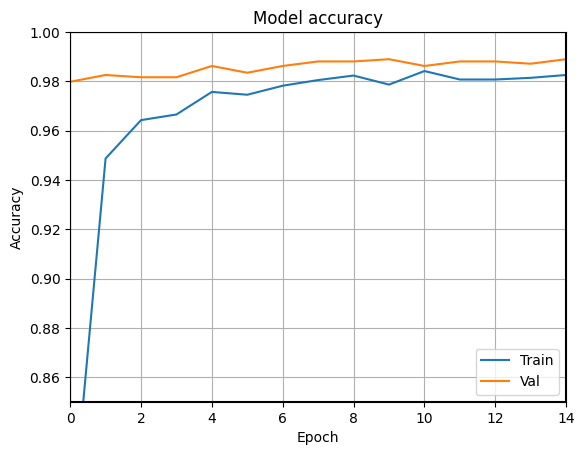

In [146]:
# Plot training and validation accuracy values
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
axes = plt.gca()
axes.set_xlim([0,14])
axes.set_ylim([0.85,1])
axes.grid(True, which='both')
axes.axhline(y=0.85, color='k')
axes.axvline(x=0, color='k')
axes.axvline(x=14, color='k')
axes.axhline(y=1, color='k')
plt.legend(['Train','Val'], loc='lower right')
plt.show()

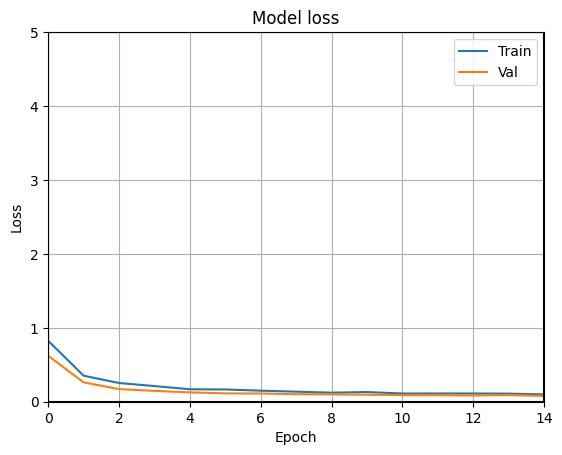

In [147]:
# Plot training and validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
axes = plt.gca()
axes.set_xlim([0,14])
axes.set_ylim([0,5])
axes.grid(True, which='both')
axes.axhline(y=0, color='k')
axes.axvline(x=0, color='k')
axes.axhline(y=5, color='k')
axes.axvline(x=14, color='k')
plt.legend(['Train','Val'], loc='upper right')
plt.show()

# Prediction

In [148]:
# Prediction
prediction = model.predict(test_X_reshaped[136:137])
prediction = prediction[0]
print('Prediction\n', prediction)
print('\nThresholded output\n', (prediction > 0.5) * 1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step
Prediction
 [0.9984858]

Thresholded output
 [1]


# Ground truth

In [149]:
print(test_y[136:137])

5389    1.0
Name: isFake, dtype: float64


# Part 2: Saving, Loading Model

# Saving

In [150]:
# Saving
model_json = model.to_json()
with open("model.json", "w") as json_file:
    json_file.write(model_json)
model.save_weights("model.weights.h5")
print("Saved model to disk")


Saved model to disk


In [151]:
# Custom Input Testing
custom_input = np.array([[100, 50, 200, 30, 2, 10, 1, 0]])  # Example user data
custom_input_reshaped = np.reshape(custom_input, (1, 1, custom_input.shape[1]))
custom_prediction = model.predict(custom_input_reshaped)
print("Custom Input Prediction:", custom_prediction[0])
print("This account is", "Fake" if custom_prediction[0] > 0.5 else "Real")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step
Custom Input Prediction: [0.04101134]
This account is Real
